In [ ]:
import random
import time
import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import fetch_openml
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split, cross_validate, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

import os
import tensorflow as tf
import tensorflow_probability as tfp

# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'


In [ ]:
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

### 1. Set-up

### Import and configure modules

In [ ]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [ ]:
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

content_image = load_img(content_path)
style_image = load_img(style_path)
style_image = tf.image.resize(style_image, [tf.shape(content_image)[1], tf.shape(content_image)[2]])

print("Content image shape:", content_image.shape)
print("Style image shape:", style_image.shape)



195196/195196 [==============================] - 0s 0us/step
Content image shape: (1, 422, 512, 3)
Style image shape: (1, 422, 512, 3)


### Define Content and Style Representations
Use the intermediate layers of the model to get the content and style representations of the image. Starting from the network's input layer, the first few layer activations represent low-level features like edges and textures. As you step through the network, the final few layers represent higher-level features—object parts like wheels or eyes. In this case, you are using the VGG19 network architecture, a pretrained image classification network. These intermediate layers are necessary to define the representation of content and style from the images. For an input image, try to match the corresponding style and content target representations at these intermediate layers.

Load a VGG19 and test run it on our image to ensure it's used correctly:

In [ ]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape


574710816/574710816 [==============================] - 7s 0us/step


TensorShape([1, 1000])

In [ ]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

35363/35363 [==============================] - 0s 0us/step


[('Labrador_retriever', 0.49317262),
 ('golden_retriever', 0.23665187),
 ('kuvasz', 0.036357313),
 ('Chesapeake_Bay_retriever', 0.024182774),
 ('Greater_Swiss_Mountain_dog', 0.018646035)]

In [ ]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)

80134624/80134624 [==============================] - 2s 0us/step

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [ ]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

The networks in tf.keras.applications are designed so you can easily extract the intermediate layer values using the Keras functional API.

To define a model using the functional API, specify the inputs and outputs:

model = Model(inputs, outputs)

This following function builds a VGG19 model that returns a list of intermediate layer outputs:

In [ ]:
# build model

def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 422, 512, 64)
  min:  0.0
  max:  835.02826
  mean:  32.875584

block2_conv1
  shape:  (1, 211, 256, 128)
  min:  0.0
  max:  4657.05
  mean:  190.13463

block3_conv1
  shape:  (1, 105, 128, 256)
  min:  0.0
  max:  8608.502
  mean:  220.17883

block4_conv1
  shape:  (1, 52, 64, 512)
  min:  0.0
  max:  20847.223
  mean:  729.54395

block5_conv1
  shape:  (1, 26, 32, 512)
  min:  0.0
  max:  3414.6833
  mean:  53.71485



###2. Implementation of Gram Matrix style



The content of an image is represented by the values of the intermediate feature maps.

It turns out, the style of an image can be described by the means and correlations across the different feature maps. Calculate a Gram matrix that includes this information by taking the outer product of the feature vector with itself at each location, and averaging that outer product over all locations. This Gram matrix can be calculated for a particular layer as:

The equation for the Gram matrix $G^l$ at a particular layer $l$ is given by:

\begin{equation}
G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x) F^l_{ijd}(x)}{IJ}
\end{equation}

where:

- $F^l_{ijc}(x)$ is the activation of the $i$th height, $j$th width, and $c$th channel of the feature map at layer $l$.
- $I$ and $J$ are the dimensions of the feature map at layer $l$, representing its height and width respectively.
- $c$ and $d$ index over the channels of the feature map.
- The summation $\sum_{ij}$ is performed over all spatial locations $i$ and $j$ in the feature map.

This equation calculates the elements of the Gram matrix by summing the product of feature activations across all spatial positions for each pair of channels $c$ and $d$. The denominator $IJ$ is the normalization factor that accounts for the number of elements in the feature maps, ensuring that the scale of the Gram matrix elements is not influenced by the size of the feature map.

In the context of neural style transfer, the Gram matrix captures the distribution of features across the different channels of a convolutional layer. Specifically, it measures how features correlate with each other over the spatial extent of the feature maps. When the Gram matrix is computed for both a style reference image and a generated image, the style loss can be formulated as the mean squared error between their respective Gram matrices. By minimizing this loss during training, the neural network adjusts the generated image's features to replicate the style of the reference image, while the content of the generated image is preserved by a separate content loss.

In [ ]:
class GramStyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(GramStyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0

    # Preprocess input by subtracting the mean values of ImageNet
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)

    # Get outputs from the VGG model
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    # We directly use the outputs that are transformed into Gram matrices
    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

**Style loss** is computed using the Gram matrices of the style representations of both the generated image and the style reference image. The style representations are extracted from certain layers of a pre-trained CNN (like VGG19), chosen because they capture the textures and patterns that define the image's style. For each of these layers, a Gram matrix is computed to represent the style of both the generated and the style images. The style loss is then the mean squared error between the Gram matrices of the generated image and the style image across these layers, normalised by the number of style layers. This normalisation ensures the loss is not disproportionately affected by the number of layers chosen.

**Content loss** measures the difference between the feature representations of the generated image and the content image, ensuring the generated image retains the 'content' of the original image. This is computed as the mean squared error between the activations of selected layers (that capture content information) in the generated image and the content image, again normalized by the number of content layers involved.

In [ ]:
def gram_matrix(input_tensor):
  # Compute the dot product of input feature maps; 'bijc,bijd->bcd' einsum notation
  # means we multiply the input tensor's height (i) and width (j) dimensions and sum them up,
  # for each filter (c, d) combination. This results in a matrix capturing the correlation
  # between different filters' activations.
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)

  # Calculate the shape of the input tensor to determine the number of locations (height * width)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)

  # Normalize the Gram matrix by dividing by the number of locations to make the scale of the style loss
  # invariant to the input tensor's size, focusing instead on the proportion of features' interactions.
  return result/(num_locations)

def gram_style_content_loss(outputs, content_targets, style_targets, style_weight, content_weight):
    style_outputs = outputs['style']
    content_outputs = outputs['content']

    # Compute style loss: Compare the style outputs of the generated image
    # with the style targets from the style image across all selected layers.
    # The mean squared error between their Gram matrices is calculated and summed up.
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])

    # Normalize the style loss by dividing by the number of style layers.
    style_loss *= style_weight / len(style_outputs)

    # Compute content loss: Compare the content outputs of the generated image
    # with the content targets from the content image across all selected layers.
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])

    # Normalize the content loss by dividing by the number of content layers.
    content_loss *= content_weight / len(content_outputs)

    # Total loss is the sum of the style and content losses.
    loss = style_loss + content_loss
    return loss

In [ ]:
gram_extractor = GramStyleContentModel(style_layers, content_layers)

gram_results = gram_extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(gram_results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(gram_results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.005522848
    max:  28014.564
    mean:  263.79025

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  61479.504
    mean:  9100.95

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  545623.44
    mean:  7660.9766

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  4320501.0
    mean:  134288.86

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  110005.38
    mean:  1487.0381

Contents:
   block5_conv2
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  2410.8796
    mean:  13.764152


###3. Implementation of Sliced Wasserstein style



The Wasserstein slicing loss function is an alternative approach for style transfer that uses the Wasserstein distance to measure the difference between the style of the generated image and the style of the target image. Unlike the Gram matrix approach, which captures the correlation of features within layers, the Wasserstein distance can more effectively measure the differences in distribution between features by considering their sorted projections onto random directions.

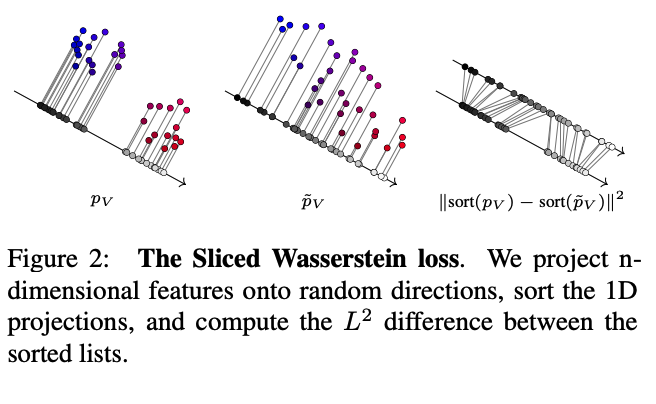


Heitz, E., Vanhoey, K., Chambon, T., & Belcour, L. (2021). A Sliced Wasserstein Loss for Neural Texture Synthesis (arXiv:2006.07229). arXiv. http://arxiv.org/abs/2006.07229



Given a neural network with $L$ layers, the Sliced Wasserstein loss between the feature distributions of two images $I$ and $\hat{I}$ is defined as:
\begin{equation}
\mathcal{L}_{SW}(I, \hat{I}) = \sum_{l=1}^L \mathcal{L}_{SW}(p^l, \hat{p}^l),
\end{equation}
where $\mathcal{L}_{SW}(p^l, \hat{p}^l)$ denotes the Sliced Wasserstein Distance between the distributions of features $p^l$ and $\hat{p}^l$ of layer $l$. It is the expected value of the one-dimensional optimal transport distances after projecting the feature points onto random directions $V$ in the unit n-dimensional hypersphere of features:
\begin{equation}
\mathcal{L}_{SW}(p^l, \hat{p}^l) = \mathbb{E}_V[\mathcal{L}_{SW1D}(p^l_V, \hat{p}^l_V)],
\end{equation}
where $p^l_V = \{\langle F^l_m, V \rangle\}$, and $F^l_m$ is the set of feature vectors for layer $l$, and $V$ is a vector on the unit sphere. $\mathcal{L}_{SW1D}$ is the one-dimensional optimal transport loss between two unordered sets of scalars and is calculated as the element-wise L2 distance over sorted lists:
\begin{equation}
\mathcal{L}_{SW1D}(S, \hat{S}) = \frac{1}{|S|} \left\| \text{sort}(S) - \text{sort}(\hat{S}) \right\|^2.
\end{equation}

Heitz, E., Vanhoey, K., Chambon, T., & Belcour, L. (2021). A Sliced Wasserstein Loss for Neural Texture Synthesis (arXiv:2006.07229). arXiv. http://arxiv.org/abs/2006.07229



In [ ]:
class WassersteinStyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(WassersteinStyleContentModel, self).__init__()
        # Load a VGG19 model pre-loaded with weights trained on ImageNet
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        """Expects float input in [0,1]"""
        inputs = inputs * 255.0
        # Preprocess input by subtracting the mean values of ImageNet
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)

        # Get outputs from the VGG model
        outputs = self.vgg(preprocessed_input)

       # Split style and content outputs
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])

        # Directly use the outputs
        content_dict = {content_name:value
                        for content_name, value
                        in zip(self.content_layers, content_outputs)}

        style_dict = {style_name:value
                      for style_name, value
                      in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}

The Wasserstein loss function projects feature activations from both the generated image and the example (style reference) image onto random normalized directions. These projections are then sorted, and the L2 distance (mean squared error) between the corresponding sorted projections is calculated. This process effectively compares the distributions of the activations by assessing how they align along multiple random slices through the activation space.

This approach tends to result in style transfer outputs that better preserve the stylistic features of the style image, as it captures more global distributional characteristics instead of just pairwise feature correlations.

In [ ]:
def wasserstein_slicing_loss(generated, example, style_weight, content_weight, SCALING_FACTOR = 1):
    list_activations_generated = [tf.identity(generated)]
    list_activations_example = [tf.identity(example)]

    # Transpose the activations to bring the channels to the second dimension
    for l in range(len(list_activations_example)):
      list_activations_generated[l] = tf.transpose(list_activations_generated[l], perm=[0,3,1,2])
      list_activations_example[l] = tf.transpose(list_activations_example[l], perm=[0,3,1,2])

    style_loss = 0.0
    content_loss = 0.0

    # This loop reshapes the activations to prepare them for slicing
    for l in range(len(list_activations_example)):
      # Get dimensions
      b = tf.shape(list_activations_example[l])[0]
      dim = tf.shape(list_activations_example[l])[1]
      n = tf.shape(list_activations_example[l])[2]*tf.shape(list_activations_example[l])[3]

      # Reshape activations into two dimensions: batch by channels and spatial locations
      activations_example = tf.reshape(list_activations_example[l], (b, dim, n))
      activations_generated = tf.reshape(list_activations_generated[l], (b, dim, n))

      # Generate and normalize random directions
      directions = tf.random.normal([dim, dim])
      normalized_directions = directions / tf.sqrt(tf.reduce_sum(tf.square(directions), axis=1, keepdims=True))

      # Project activations onto the random directions and sort them
      # This is equivalent to taking random 1D slices of the activation space
      def project_and_sort(activations):
          projected_activations = tf.einsum('bdn,md->bmn', activations, normalized_directions)
          return tf.sort(projected_activations, axis=2)

      sorted_activations_example = project_and_sort(activations_example)
      sorted_activations_generated = project_and_sort(activations_generated)

      # The L2 distance over sorted lists is computed as the style loss
      if l < num_style_layers:
        style_loss += tf.reduce_mean(tf.square(sorted_activations_example - sorted_activations_generated))

    return style_loss

In [ ]:
def wasserstein_style_content_loss(outputs, content_targets, style_targets, style_weight, content_weight):
  style_outputs = outputs['style']
  content_outputs = outputs['content']

  # Calculate style loss using Sliced Wasserstein Distance
  style_loss = tf.add_n([wasserstein_slicing_loss(style_outputs[name], style_targets[name], style_weight, content_weight)
      for name in style_outputs.keys()])
  style_loss *= style_weight / len(style_outputs)

  # Calculate content loss using mean squared error
  content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
  content_loss *= content_weight / len(content_outputs)
  loss = style_loss + content_loss
  return loss

In [ ]:
wasserstein_extractor = WassersteinStyleContentModel(style_layers, content_layers)

wasserstein_results = wasserstein_extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(wasserstein_results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(wasserstein_results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 422, 512, 64)
    min:  0.0
    max:  550.1154
    mean:  15.226082

   block2_conv1
    shape:  (1, 211, 256, 128)
    min:  0.0
    max:  3191.6497
    mean:  89.55595

   block3_conv1
    shape:  (1, 105, 128, 256)
    min:  0.0
    max:  4486.9497
    mean:  81.42939

   block4_conv1
    shape:  (1, 52, 64, 512)
    min:  0.0
    max:  13530.51
    mean:  351.38464

   block5_conv1
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  4270.3394
    mean:  33.99466

Contents:
   block5_conv2
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  2410.8796
    mean:  13.764152


###4. Style Transfer (Gradient Descent)

TensorFlow's tf.GradientTape is a context manager that records operations for automatic differentiation. When you perform operations inside the context of GradientTape, TensorFlow tracks all trainable variables involved and can later compute the gradient of some target (usually loss) with respect to these variables.

The gradient of the loss with respect to the image is computed using the .gradient method of the Gradient Tape. This gradient tells us how to change the pixel values of the image to minimize the loss; in other words, it provides the direction and magnitude of the update required to make the image's style more similar to the target style image

In [ ]:
# gram
@tf.function()
def train_step_gram(image, style, extractor, optimizer, style_weight, content_weight):
  gram_style_targets = extractor(style)['style']
  gram_content_targets = extractor(image)['content']
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = gram_style_content_loss(outputs, gram_content_targets, gram_style_targets, style_weight, content_weight)
  grad = tape.gradient(loss, image)
  optimizer.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

# sliced
@tf.function()
def train_step_wasserstein(image, style, extractor, optimizer, style_weight, content_weight):
  sliced_style_targets = extractor(style)['style']
  sliced_content_targets = extractor(image)['content']
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = wasserstein_style_content_loss(outputs, sliced_content_targets, sliced_style_targets, style_weight, content_weight)
  grad = tape.gradient(loss, image)
  optimizer.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))


# Function to keep the pixel values between 0 and 1
# The updated image is then clipped to ensure its values remain between 0 and 1.
# This step is crucial as it keeps the pixel values within the valid range of colors.
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)



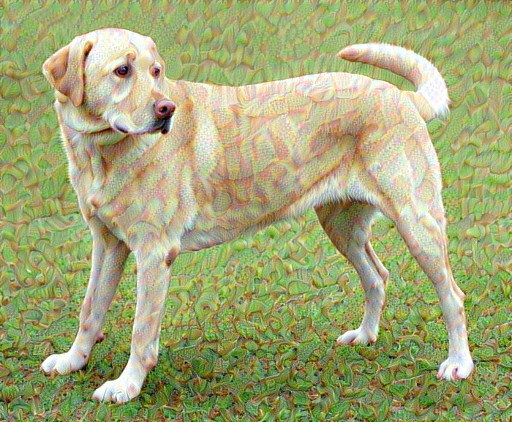

In [ ]:
# gram
gram_style_targets = gram_extractor(style_image)['style']
gram_content_targets = gram_extractor(content_image)['content']
image_gram = tf.Variable(content_image)
style_gram = style_image


style_weight=1e-2
content_weight=1e4

opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
opt.build([image_gram])

train_step_gram(image_gram, style_gram, gram_extractor, opt, 1e-2, 1e4)
train_step_gram(image_gram, style_gram, gram_extractor, opt, 1e-2, 1e4)
train_step_gram(image_gram, style_gram, gram_extractor, opt, 1e-2, 1e4)
train_step_gram(image_gram, style_gram, gram_extractor, opt, 1e-2, 1e4)
tensor_to_image(image_gram)


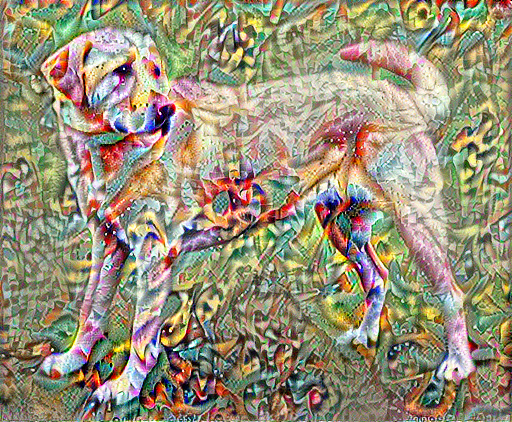

Train step: 1000
Total time: 134.6


In [ ]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_gram(image_gram, style_gram, gram_extractor, opt, 1e-2, 1e4)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_gram))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

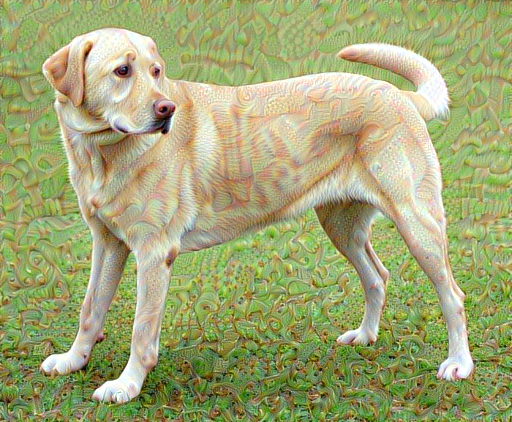

In [ ]:
# sliced
image_sliced = tf.Variable(content_image)

style_weight=1e8
content_weight=1e8

opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
opt.build([image_sliced])
sliced_style_image = style_image
content_targets = wasserstein_extractor(content_image)['content']

# style_list = generate_list_activations(sliced_style_image, wasserstein_extractor)
train_step_wasserstein(image_sliced, sliced_style_image, wasserstein_extractor, opt, 1e8, 1e8)
train_step_wasserstein(image_sliced, sliced_style_image, wasserstein_extractor, opt, 1e8, 1e8)
train_step_wasserstein(image_sliced, sliced_style_image, wasserstein_extractor, opt, 1e8, 1e8)
train_step_wasserstein(image_sliced, sliced_style_image, wasserstein_extractor, opt, 1e8, 1e8)

tensor_to_image(image_sliced)

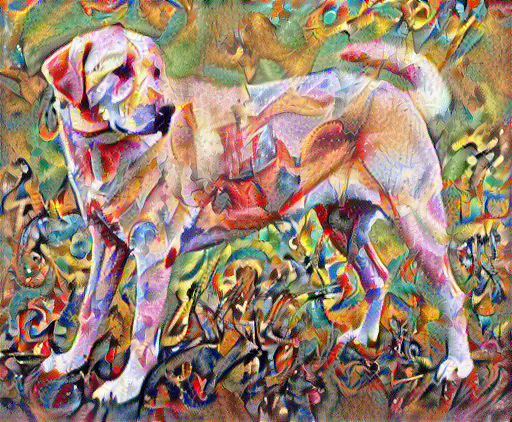

Train step: 1000
Total time: 183.5


In [ ]:
import time
start = time.time()

content_targets = wasserstein_extractor(content_image)['content']

image_sliced = tf.Variable(content_image)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer.build([image_sliced])

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_wasserstein(image_sliced, sliced_style_image, wasserstein_extractor, opt, 1e8, 1e8)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_sliced))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))





In [ ]:
# Below is the implementation of the scipy LBFGS optimizer
# Not enough computational resources - RAM kept timing out D:
# so the Adam optimizer was used instead for the Sliced Wasserstein

# from scipy.optimize import fmin_l_bfgs_b

# def compute_loss_and_gradients(image):
#     # No need to reshape here as 'image' is already in the correct shape
#     with tf.GradientTape() as tape:
#         tape.watch(image)
#         outputs = wasserstein_extractor(image)  # Directly use 'image'
#         # loss = wasserstein_style_content_loss_tf(outputs, sliced_style_targets, sliced_content_targets, num_style_layers, num_content_layers)
#         loss = wasserstein_style_content_loss_texture(outputs)
#     gradients = tape.gradient(loss, image)
#     # Flatten the gradients and loss for compatibility with SciPy
#     gradients = gradients.numpy().flatten().astype('float64')
#     loss = loss.numpy().astype('float64')
#     return loss, gradients


#  def scipy_value_and_grad(image):
#     # Wrapper function for SciPy's optimizer to compute loss and gradients
#     loss, gradients_np = compute_loss_and_gradients(tf.convert_to_tensor(image.reshape(content_image.shape), dtype=tf.float32))
#     return loss, gradients_np

# def train_lbfgs(nb_iter, content, extractor):
#     content_flat = content.numpy().flatten()  # Flatten the content image to serve as the initial guess
#     image_flat = content_flat  # Initialize the optimization variable

#     for i in range(nb_iter):
#         # Perform the optimization using the flattened image as the starting point
#         result = fmin_l_bfgs_b(func=scipy_value_and_grad, x0=image_flat, maxfun=64)
#         image_flat = result[0]  # Update the flattened image with the optimizer's result
#         print(f'Iter {i+1}, Loss: {result[1]}')

#     # After the loop, ensure the optimized flattened image is reshaped back to the original content image's shape
#     optimized_image = np.clip(image_flat, 0, 1).reshape(content.shape)

#     return optimized_image


# output_image = train_lbfgs(1, content_image, wasserstein_extractor)

# plt.imshow(output_image[0])  # Use the first item in the batch for display
# plt.axis('off')
# plt.show()

# Numerical Metrics to Evaluate Experiments

### Peak-To-Signal Ratio

$$
\text{PSNR} = 20 \cdot \log_{10} \left( \frac{\text{MAX}_I}{\sqrt{\text{MSE}}} \right)
$$

where $MAX_I$is the maximum possible pixel value of the image (255 for 8-bit images), and $MSE$ is the mean squared error between the original and generated images.


In [ ]:
def calculate_psnr(original_image, generated_image):
    mse = np.mean((original_image - generated_image) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr


### SSIM Index

The Structural Similarity Index Measure (SSIM) is a metric used to measure the similarity between two images. SSIM is designed to improve on traditional methods like peak signal-to-noise ratio (PSNR) and mean squared error (MSE) by considering changes in structural information, luminance, and contrast, which are more aligned with human visual perception.

SSIM takes values between -1 and 1, where 1 indicates identical images and -1 indicates no structural similarity at all. The formula for SSIM for two windows
$x$ and $y$ of common size $N*N$

$$
\text{SSIM}(x, y) = \frac{(2\mu_x\mu_y + c_1)(2\sigma_{xy} + c_2)}{(\mu_x^2 + \mu_y^2 + c_1)(\sigma_x^2 + \sigma_y^2 + c_2)}
$$

Where:
- $\mu_x$ and $\mu_y$ are the average intensity values of windows $x$ and $y$,
- $\sigma_x^2$ and $\sigma_y^2$ are the variances of $x$ and $y$,
- $\sigma_{xy}$ is the covariance of $x$ and $y$,
- $c_1=(k_1L)^2$ and $c_2=(k_2L)^2$ are variables to stabilize the division with weak denominator; $L$ is the dynamic range of the pixel values (255 for 8-bit grayscale images), and $k_1=0.01$ and $k_2=0.03$ by default.


In [ ]:
from skimage.metrics import structural_similarity as ssim

def calculate_SSIM(original_image, generated_image):
    # Ensure both images are TensorFlow tensors and in float32 format
    original_image = tf.convert_to_tensor(original_image, dtype=tf.float32)
    generated_image = tf.convert_to_tensor(generated_image, dtype=tf.float32)

    # Resize original image to match generated image dimensions, if they are different
    if original_image.shape != generated_image.shape:
        original_image_resized = tf.image.resize(original_image, [generated_image.shape[1], generated_image.shape[2]])
    else:
        original_image_resized = original_image

    # Add a batch dimension if it's missing
    if len(original_image_resized.shape) == 3:
        original_image_resized = tf.expand_dims(original_image_resized, axis=0)
    if len(generated_image.shape) == 3:
        generated_image = tf.expand_dims(generated_image, axis=0)

    # Compute SSIM
    ssim_index = tf.image.ssim(original_image_resized, generated_image, max_val=1.0)
    return ssim_index.numpy()

### Total Variation Loss

Measures the smoothness of an image and helps determine hig-frequency artifacts in the output image in style transfer. The total variation loss of image $I$ can be defined as the sum of absolute differences between neighboring pixel values, encouraging spatial smoothness in the generated image.

$$
TV(I) = \sum_{i,j} \left( (I_{i,j+1} - I_{i,j})^2 + (I_{i+1,j} - I_{i,j})^2 \right)^{\frac{1}{2}}
$$

Where:
- $I$ is the image,
- $I_{i,j}$ represents the pixel value at position $(i, j)$,
- The first term $(I_{i,j+1} - I_{i,j})^2$ calculates the square of the difference between horizontally adjacent pixels,
- The second term $(I_{i+1,j} - I_{i,j})^2$ calculates the square of the difference between vertically adjacent pixels.


In [ ]:
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

def calculate_total_variation_loss(image):
  x_deltas, y_deltas = high_pass_x_y(image)
  return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

In [ ]:
def calculate_metrics(original_image, generated_image):
    # Convert tensors to numpy arrays for SSIM and L1 loss calculations
    original_np = original_image.numpy()
    generated_np = generated_image.numpy()
    generated_tensor = generated_image.value() if hasattr(generated_image, 'value') else generated_image

    # PSNR
    psnr = calculate_psnr(original_np, generated_np)
    print(f'PSNR: ', psnr)


    ssim = calculate_SSIM(original_image, generated_tensor)
    print(f'SSIM: ', ssim)

    # Total Variation Loss
    tv_loss = calculate_total_variation_loss(generated_image).numpy()
    print(f'Total Variation Loss: ', tv_loss)

    # Pixel Difference (L1 Loss)
    l1_loss = tf.reduce_mean(tf.abs(original_image - generated_image)).numpy()
    print(f'L1 Loss: ', l1_loss)

    return psnr, ssim, tv_loss, l1_loss

In the context of style transfer, maintaining a high SSIM, PSNR, and a low TV Loss is critical for enhancing the quality of the generated images. A high SSIM value indicates a strong visual similarity between the generated image and the content image, ensuring that the essence and structure of the content are preserved even after the style has been applied. Similarly, a high PSNR suggests that the generated image has a low level of noise and distortion in comparison to the original content image, which is crucial for maintaining clarity and detail. On the other hand, minimising TV Loss helps in smoothing and denoising the image without sacrificing textural details, leading to cleaner, more coherent visual outputs. Collectively, these metrics serve as benchmarks for balancing the fidelity of content preservation with the aesthetic integration of the chosen style, ultimately contributing to the generation of visually pleasing and artistically stylized images.

# Experiment 1: Comparing varying content layer depths

**Objective:** To evaluate how changing convolutional layers used for content representations affects the style transfer quality and content preservation.

**Hypothesis:** Altering the depth of convolutional layers for style representation will significantly impact the stylization's visual quality, with deeper layers potentially capturing more abstract features of the style and affect how well the content structure is preserved in the transferred image.

**Constants:**


*   Number of train steps: 1000

*   Style layer

```
style_layers_1a = ['block1_conv1',
                  'block2_conv1',
                  'block3_conv1',
                  'block4_conv1',
                  'block5_conv1']
```

* Optimizer: ```tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)```
* Starting style and content image

**Independent:**
*   Varying depths of the content layer

**Dependent:**
*   Output styled image evaluated with Metrics (PSNR, SSIM, TV Loss, L1 Loss)



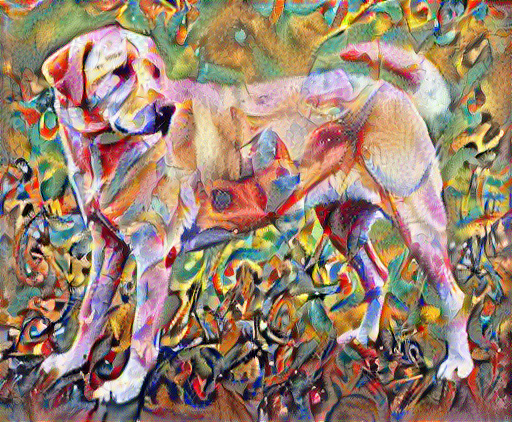

Train step: 1000
Total time: 1636.7


In [ ]:
# Configuration A (Deep Content Layer)
content_layers_1a = ['block1_conv1']
style_layers_1a = ['block1_conv1',
                   'block2_conv1',
                   'block3_conv1',
                   'block4_conv1',
                   'block5_conv1']
wasserstein_extractor_1a = WassersteinStyleContentModel(style_layers_1a, content_layers_1a)

style_image_1a = style_image
image_1a = tf.Variable(content_image)

optimizer_1a = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1a.build([image_1a])

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_wasserstein(image_1a, style_image_1a, wasserstein_extractor_1a, optimizer_1a, 1e8, 1e8)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1a))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))



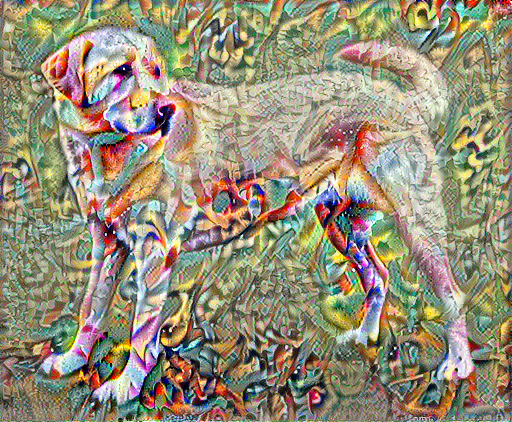

Train step: 1000
Total time: 515.2


In [ ]:
gram_extractor_1a = GramStyleContentModel(style_layers_1a, content_layers_1a)

style_image_1ag = style_image
image_1ag = tf.Variable(content_image)

optimizer_1ag = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1ag.build([image_1ag])


step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_gram(image_1ag, style_image_1ag, gram_extractor_1a, optimizer_1ag, 1e-2, 1e4)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1ag))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
print('Metrics for Wasserstein')
calculate_metrics(content_image, image_1a)
print('Metrics for Gram')
calculate_metrics(content_image, image_1ag)


Metrics for Wasserstein
PSNR:  62.88417207697645
SSIM:  [0.2613888]
Total Variation Loss:  101789.43
L1 Loss:  0.14365743
Metrics for Gram
PSNR:  62.70970873013034
SSIM:  [0.20610292]
Total Variation Loss:  131109.45
L1 Loss:  0.14817567


(62.70970873013034, array([0.20610292], dtype=float32), 131109.45, 0.14817567)

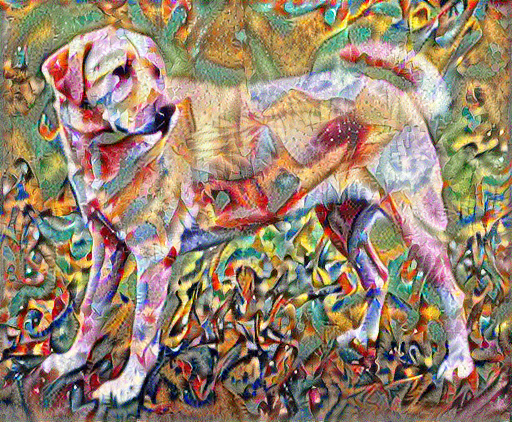

Train step: 1000
Total time: 1850.3


In [ ]:
# Configuration B (Middle Content Layer)
content_layers_1b = ['block2_conv1']  # Shallow content layer
style_layers_1b = style_layers_1a
wasserstein_extractor_1b = WassersteinStyleContentModel(style_layers_1b, content_layers_1b)

style_image_1b = style_image
image_1b = tf.Variable(content_image)

optimizer_1b = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1b.build([image_1b])

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_wasserstein(image_1b, style_image_1b, wasserstein_extractor_1b, optimizer_1b, 1e8, 1e8)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1b))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))


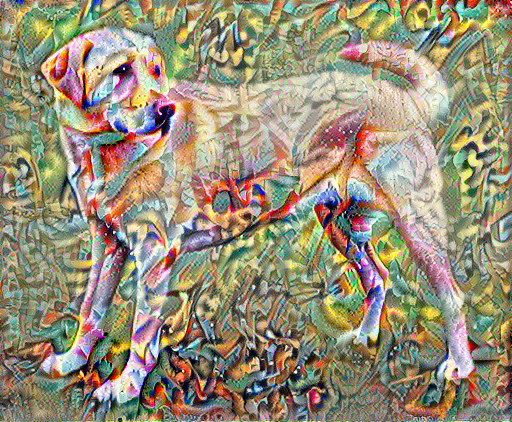

Train step: 1000
Total time: 630.7


In [ ]:
gram_extractor_1b = GramStyleContentModel(style_layers_1b, content_layers_1b)

style_image_1bg = style_image
image_1bg = tf.Variable(content_image)

optimizer_1bg = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1bg.build([image_1bg])


step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_gram(image_1bg, style_image_1bg, gram_extractor_1b, optimizer_1bg, 1e-2, 1e4)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1bg))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
print('Metrics for Wasserstein')
calculate_metrics(content_image, image_1b)
print('Metrics for Gram')
calculate_metrics(content_image, image_1bg)

Metrics for Wasserstein
PSNR:  62.74032115036814
SSIM:  [0.22821414]
Total Variation Loss:  113556.67
L1 Loss:  0.14727099
Metrics for Gram
PSNR:  62.99739892412912
SSIM:  [0.22323985]
Total Variation Loss:  123842.16
L1 Loss:  0.14288044


(62.99739892412912, array([0.22323985], dtype=float32), 123842.16, 0.14288044)

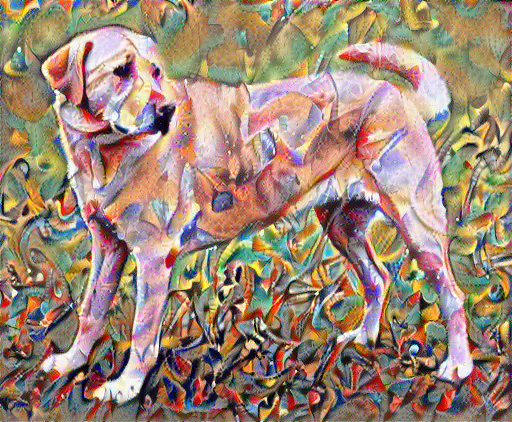

Train step: 1000
Total time: 776.5


In [ ]:
# Configuration C (Middle Content Layer)
content_layers_1c = ['block3_conv1']  # Shallow content layer
style_layers_1c = ['block2_conv2',
                  'block3_conv4',
                  'block4_conv4',
                  'block5_conv4']
wasserstein_extractor_1c = WassersteinStyleContentModel(style_layers_1c, content_layers_1c)



style_image_1c = style_image
image_1c = tf.Variable(content_image)

optimizer_1c = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1c.build([image_1c])

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_wasserstein(image_1c, style_image_1c, wasserstein_extractor_1c, optimizer_1c, 1e8, 1e8)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1c))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))


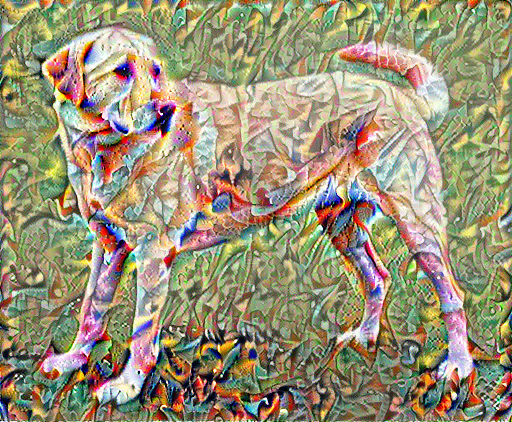

Train step: 1000
Total time: 898.1


In [ ]:
gram_extractor_1c = GramStyleContentModel(style_layers_1c, content_layers_1c)

style_image_1cg = style_image
image_1cg = tf.Variable(content_image)

optimizer_1cg = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1cg.build([image_1cg])


step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_gram(image_1cg, style_image_1cg, gram_extractor_1c, optimizer_1cg, 1e-2, 1e4)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1cg))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
print('Metrics for Wasserstein')
calculate_metrics(content_image, image_1c)
print('Metrics for Gram')
calculate_metrics(content_image, image_1cg)

Metrics for Wasserstein
PSNR:  63.488962667198656
SSIM:  [0.28903607]
Total Variation Loss:  102261.33
L1 Loss:  0.13209154
Metrics for Gram
PSNR:  63.359915535815276
SSIM:  [0.24374478]
Total Variation Loss:  122434.91
L1 Loss:  0.13584706


(63.359915535815276, array([0.24374478], dtype=float32), 122434.91, 0.13584706)

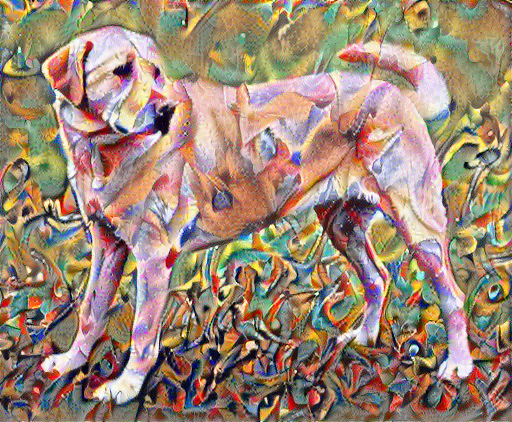

Train step: 1000
Total time: 1053.2


In [ ]:
# Configuration D (Middle Content Layer)
content_layers_1d = ['block4_conv1']  # Shallow content layer
style_layers_1d = ['block2_conv2',
                  'block3_conv4',
                  'block4_conv4',
                  'block5_conv4']
wasserstein_extractor_1d = WassersteinStyleContentModel(style_layers_1d, content_layers_1d)



style_image_1d = style_image
image_1d = tf.Variable(content_image)

optimizer_1d = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1d.build([image_1d])

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_wasserstein(image_1d, style_image_1d, wasserstein_extractor_1d, optimizer_1d, 1e8, 1e8)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1d))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))


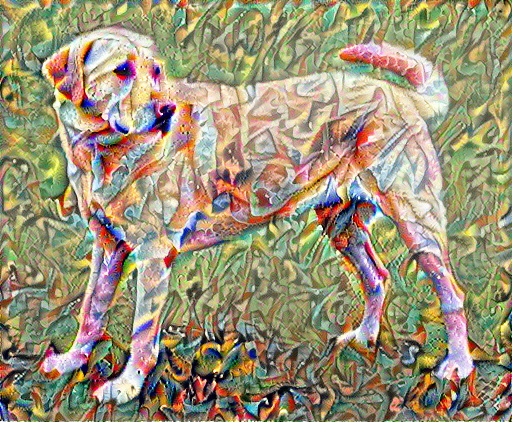

Train step: 1000
Total time: 1183.8


In [ ]:
gram_extractor_1d = GramStyleContentModel(style_layers_1d, content_layers_1d)

style_image_1dg = style_image
image_1dg = tf.Variable(content_image)

optimizer_1dg = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1dg.build([image_1dg])


step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_gram(image_1dg, style_image_1dg, gram_extractor_1d, optimizer_1dg, 1e-2, 1e4)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1dg))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
print('Metrics for Wasserstein')
calculate_metrics(content_image, image_1d)
print('Metrics for Gram')
calculate_metrics(content_image, image_1dg)

Metrics for Wasserstein
PSNR:  63.468364123609575
SSIM:  [0.28566512]
Total Variation Loss:  103306.75
L1 Loss:  0.13265254
Metrics for Gram
PSNR:  63.69373982793444
SSIM:  [0.26265526]
Total Variation Loss:  115306.44
L1 Loss:  0.13038331


(63.69373982793444, array([0.26265526], dtype=float32), 115306.44, 0.13038331)

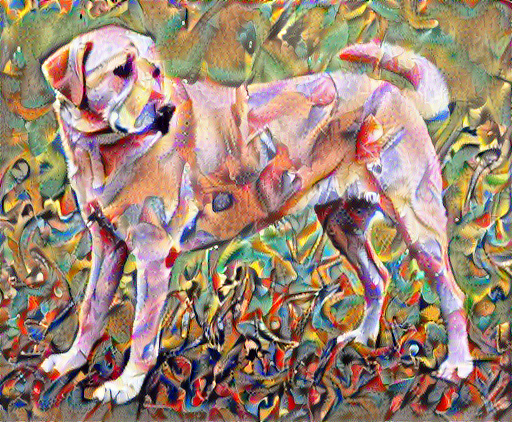

Train step: 1000
Total time: 1348.9


In [ ]:
# Configuration E (Deeper Content Layer)
content_layers_1e = ['block5_conv1']  # Shallow content layer
style_layers_1e = ['block2_conv2',
                  'block3_conv4',
                  'block4_conv4',
                  'block5_conv4']
wasserstein_extractor_1e = WassersteinStyleContentModel(style_layers_1e, content_layers_1e)



style_image_1e = style_image
image_1e = tf.Variable(content_image)

optimizer_1e = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1e.build([image_1e])

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_wasserstein(image_1e, style_image_1e, wasserstein_extractor_1e, optimizer_1e, 1e8, 1e8)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1e))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))


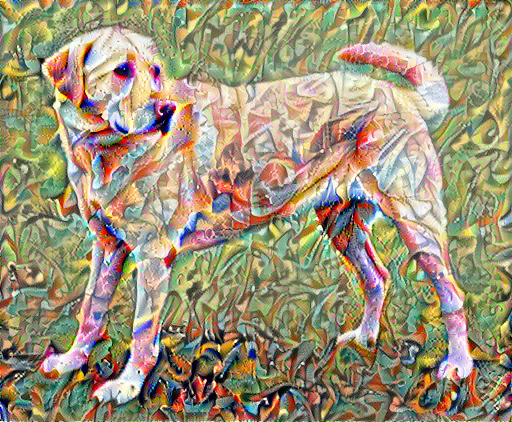

Train step: 1000
Total time: 1490.4


In [ ]:
gram_extractor_1e = GramStyleContentModel(style_layers_1e, content_layers_1e)

style_image_1eg = style_image
image_1eg = tf.Variable(content_image)

optimizer_1eg = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.5)
optimizer_1eg.build([image_1eg])


step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_gram(image_1eg, style_image_1eg, gram_extractor_1e, optimizer_1eg, 1e-2, 1e4)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image_1eg))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
print('Metrics for Wasserstein')
calculate_metrics(content_image, image_1e)
print('Metrics for Gram')
calculate_metrics(content_image, image_1eg)

Metrics for Wasserstein
PSNR:  63.572693500986375
SSIM:  [0.2974534]
Total Variation Loss:  100457.78
L1 Loss:  0.13057359
Metrics for Gram
PSNR:  64.06010034496452
SSIM:  [0.28166637]
Total Variation Loss:  109881.58
L1 Loss:  0.12488704


(64.06010034496452, array([0.28166637], dtype=float32), 109881.58, 0.12488704)